# Milestone 6: The Sliding Lid

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import IPython.display as display
import src.simulation as sim
import src.boundary as bdry
import src.visualization as visz
import os
import sys
from tqdm import trange, tqdm

## Parameters

<style>table { display: inline-block; }</style>

Combination of 12 different parameter sets ($L$, $\nu$, $U_w$) and the resulting Reynolds number $Re$:

| $L$ | $\nu$  | $\omega$ | $U_w$ | $Re$
|-----|--------|----------|-------|-----
| 300 | 0.03   | ~1.69    | 0.025 | 250 
|     |        |          | 0.05  | 500 
|     |        |          | 0.075 | 750 
|     |        |          | 0.1   | 1000
|     | 0.09   | ~1.30    | 0.075 | 250 
|     |        |          | 0.15  | 500 
|     |        |          | 0.225 | 750 
|     |        |          | 0.3   | 1000
|     | 0.15   | ~1.05    | 0.125 | 250 
|     |        |          | 0.25  | 500 
|     |        |          | 0.375 | 750 
|     |        |          | 0.5   | 1000

In [2]:
L = 300
n_steps = 100000
params = [(Re, nu, Re*nu/L)
          for nu in [0.03, 0.09, 0.15]
          for Re in [250, 500, 750, 1000]]

# animation: plot only every nth step and increase step size over time
anim_stages = visz.PlotStages([(0, 10), (1000, 50), (5000, 100), (20000, 500), (50000, 1000)])
anim_steps = anim_stages.list(n_steps)

## Initialize

In [3]:
lattice = [
    sim.LatticeBoltzmann(L, L, viscosity=viscosity, init_density=np.ones((L, L)),
                         boundaries=[bdry.MovingWallBoundaryCondition("t", [0, wall_velocity]),
                                     bdry.RigidWallBoundaryCondition("blr")],
                         plot=False, animate=False)
    for _, viscosity, wall_velocity in params
]

## Simulation and Measurements

In [4]:
for l in range(len(lattice)):
    velocity_field = np.empty((len(anim_steps), 2, L, L))
    j = 0
    for i in trange(n_steps, file=sys.stdout, desc=f"lattice {l+1:2}/{len(lattice)}"):
        if i in anim_steps:
            velocity_field[j] = lattice[l].velocity
            j += 1
        lattice[l].step()
    velocity_field[-1] = lattice[l].velocity
    # save result
    os.makedirs("out/m6", exist_ok=True)
    np.save(f"out/m6/lattice_{l}.npy", velocity_field)

lattice 12/12: 100%|██████████| 100000/100000 [33:14<00:00, 50.15it/s]


## Plot Results

### Steady-state streamplots for different parameters

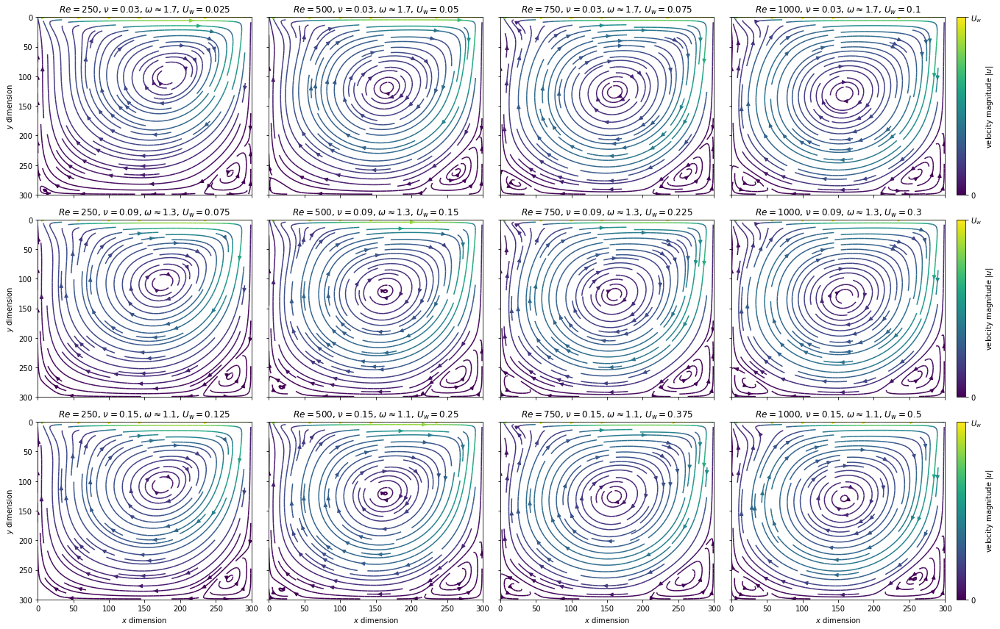

In [4]:
n_cols = 4
n_rows = len(lattice) // n_cols
fig, ax = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(19, 16*(n_rows/n_cols)), gridspec_kw={"width_ratios": [1, 1, 1, 1.11]})
axf = ax.flatten()
axf[0].set_xlim(0, L)
axf[0].set_ylim(0, L)
axf[0].invert_yaxis()
x = np.arange(L)
y = np.arange(L)
for l in range(len(lattice)):
    Re, viscosity, wall_velocity = params[l]
    axf[l].set_title(f"$Re={Re}$, $\\nu={viscosity}$, $\omega \\approx {lattice[l].omega:.1f}$, $U_w={wall_velocity}$")
    if l % n_cols == 0:
        axf[l].set_ylabel("$y$ dimension")
    if l >= n_cols*(n_rows-1):
        axf[l].set_xlabel("$x$ dimension")
    velocity_field = np.load(f"out/m6/lattice_{l}.npy")
    u = velocity_field[-1, 1]
    v = velocity_field[-1, 0]
    norm = plt.Normalize(0, wall_velocity)
    axf[l].streamplot(x, y, u, v, color=np.sqrt(u**2 + v**2), norm=norm, density=1.2)
    if l % n_cols == 3:
        cbar = fig.colorbar(plt.cm.ScalarMappable(norm, plt.cm.viridis), ax=axf[l], fraction=0.05,
                            ticks=[0, wall_velocity], label="velocity magnitude $|u|$")
        cbar.ax.set_yticklabels(["0", "$U_w$"])
fig.tight_layout()
plt.show()

### Animation

In [5]:
%matplotlib ipympl

l = 7
Re, viscosity, wall_velocity = params[l]
velocity_field = np.load(f"out/m6/lattice_{l}.npy")
velocity_magnitude = np.sqrt(velocity_field[:, 1]**2 + velocity_field[:, 0]**2)

fig, ax = plt.subplots(figsize=(6.8, 6.0), dpi=180)
fig.suptitle(f"Sliding Lid Experiment", fontweight="bold")
cmap = plt.cm.viridis
fig.colorbar(plt.cm.ScalarMappable(plt.Normalize(0, wall_velocity), cmap), ax=ax, label="velocity magnitude $|u|$")
x = y = np.arange(L)


def update_streamplot(frame):
    i, t = frame
    ax.clear()
    ax.set_title(f"$Re={Re}$, $\\nu={viscosity}$, $\omega \\approx {lattice[l].omega:.1f}$, " +
                 f"$U_w={wall_velocity}$, $t={t}$ (x{anim_stages.get_step_size(t)})", loc="left")
    ax.set_xlabel(f"$x$ dimension")
    ax.set_ylabel(f"$y$ dimension")
    ax.set_xlim(0, L)
    ax.set_ylim(0, L)
    ax.invert_yaxis()
    fig.tight_layout()
    u, v = velocity_field[i, 1], velocity_field[i, 0]
    c = velocity_magnitude[i] if velocity_magnitude[i].sum() > 0 else "black"
    return ax.streamplot(x, y, u, v, density=2.0, color=c, cmap=cmap)


animation = anim.FuncAnimation(fig, update_streamplot, frames=list(enumerate(anim_steps)))
with tqdm(anim_steps, file=sys.stdout) as pbar:
    animation.save("out/m6/sliding_lid.webm", fps=25,
                   writer="ffmpeg", codec="libvpx-vp9", extra_args=["-an", "-crf", "42"],
                   progress_callback=lambda i, n: pbar.update())
plt.close()

100%|██████████| 441/441 [06:15<00:00,  1.17it/s]


In [6]:
display.Video("out/m6/sliding_lid.webm", embed=True, height=540)